In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from matplotlib.colors import LogNorm
from matplotlib.gridspec import GridSpec
from TDECalculator import TDECalculator

plt.style.use("plot_style.mplstyle")
plt.rc('text', usetex=True)

In [2]:
def energy_plots(whole_star_sample): 
    # unpack
    dE_rand   = whole_star_sample['dEnergy_random']      # shape (nr-1, N_Omega)
    dE_unp    = whole_star_sample['dEnergy_unperturbed']
    dT_rand   = whole_star_sample['dT_random']
    dT_unp    = whole_star_sample['dT_unperturbed']
    dMass     = whole_star_sample['dMass']               # same shape

    # set up figure
    fig, (axE, axT) = plt.subplots(1, 2, figsize=(12,5))

    # histograms in E
    bins_E = np.linspace(-2, 2, 200)
    axE.hist(dE_rand.flatten(),
            weights=dMass.flatten(),
            bins=bins_E,
            density=True,
            alpha=0.5)
    axE.set_yscale('log')
    axE.set_xlabel(r'$ E / \Delta E$')
    axE.set_ylabel(r'$(\mathrm{d}M/\mathrm{d}E) / (M_\star / \Delta E)$')

    # histograms in T
    bins_T = np.logspace(0, 6, 200)
    axT.hist(dT_rand.flatten(),
            weights=dMass.flatten(),
            bins=bins_T,
            density=True,
            alpha=0.5)
    # overplot T^{-5/3} reference
    axT.plot(bins_T, 10*bins_T**(-5/3), 'k--', label=r'$T^{-5/3}$')
    axT.set_xscale('log')
    axT.set_yscale('log')
    axT.set_xlabel(r'$T / \Delta T$')
    axT.set_ylabel(r'$(\mathrm{d}M/\mathrm{d}T) / (M_\star / \Delta T)$')

    plt.tight_layout()
    plt.show()

In [3]:
def plot_dens_helper(calcs):
    if not isinstance(calcs, (list, tuple)):
        calcs = [calcs]

    n = len(calcs)

    nbins = 300
    x_edges = np.linspace(-2, 2, nbins+1)
    y_edges = np.linspace(-3, 3, nbins+1)
    dx = x_edges[1] - x_edges[0]
    dy = y_edges[1] - y_edges[0]
    area = dx * dy

    # Precompute interpolated densities
    interp_densities = []
    for calc in calcs:
        equator_sample = calc.equator_sample(n_phi=3000)
        POS = equator_sample['POS']
        dMass = equator_sample['dMass']

        x_pos = POS[..., 0].flatten()
        y_pos = POS[..., 1].flatten()
        mass_flat = dMass.flatten()

        mass_hist, _, _ = np.histogram2d(
            x_pos, y_pos,
            bins=[x_edges, y_edges],
            weights=mass_flat
        )
        density2D = mass_hist / area

        Xc, Yc = np.meshgrid(
            0.5 * (x_edges[:-1] + x_edges[1:]),
            0.5 * (y_edges[:-1] + y_edges[1:])
        )
        density2D += 1e-12 * (Xc + Yc)

        points = np.column_stack((Xc.flatten(), Yc.flatten()))
        values = density2D.T.flatten()
        xi = np.linspace(Xc.min(), Xc.max(), nbins-1)
        yi = np.linspace(Yc.min(), Yc.max(), nbins-1)
        XI, YI = np.meshgrid(xi, yi)
        dens_interp = griddata(points, values, (XI, YI), method='linear')

        dens_interp += dens_interp.max() * 1e-8
        dens_interp /= dens_interp.max()

        interp_densities.append((dens_interp, XI, YI, calc))

    # Shared log-scale limits
    global_min = min(d[d[0] > 0].min() for d, _, _, _ in interp_densities)
    global_max = 1.0  # normalized
    levels = np.logspace(np.log10(global_min), np.log10(global_max), 100)
    norm = LogNorm(vmin=global_min, vmax=global_max)

    # Setup figure with extra column on RIGHT for colorbar
    fig = plt.figure(figsize=(n * 6 + 2, 9.7))
    gs = GridSpec(1, n + 1, width_ratios=[1]*n + [0.06], wspace=0.03)

    # Plot subplots
    for idx, (dens_interp, XI, YI, calc) in enumerate(interp_densities):
        ax = fig.add_subplot(gs[0, idx])

        cf = ax.contourf(XI, YI, dens_interp, levels=levels, cmap='viridis', norm=norm)

        phi0 = calc.Phi_TDE
        ax.arrow(-1.5, 2.25, -0.3*np.cos(phi0), -0.3*np.sin(phi0),
                 linewidth=2, head_width=0.1, head_length=0.1, color='white')
        ax.text(-1.5-0.3*np.cos(phi0)+0.1,
                2.25-0.3*np.sin(phi0)+0.1,
                'to BH', color='white', fontsize=18)

        beta = calc.Rtidal / calc.Rp
        name = calc.star_name[4:-4].replace('p', '.')
        ax.text(1.1, 2.5, fr'${name}\,M_\odot$',
                color='white', fontsize=28, fontweight='bold')
        ax.text(-1.7, -2.5, fr'$\beta={beta:.2f}$',
                color='white', fontsize=28, fontweight='bold')

        ax.set_aspect('equal')
        ax.axis('off')

    # Colorbar axis on far RIGHT
    cax = fig.add_subplot(gs[0, -1])
    cb = fig.colorbar(cf, cax=cax)
    cb.set_label('$\\rho/\\rho_c$')
    cb.set_ticks([1e-8, 1e-6, 1e-4, 1e-2, 1])

    plt.subplots_adjust(wspace=0.05, left=0.02, right=0.98, top=0.95, bottom=0.05)
    plt.show()

In [4]:
def plot_dens(orbit, MBH, Rp, a, N):
    mass0p5 = TDECalculator('MAMS0p5Msun', orbit, MBH, Rp, a, N)
    mass1 = TDECalculator('MAMS1Msun', orbit, MBH, Rp, a, N)
    mass2 = TDECalculator('MAMS2Msun', orbit, MBH, Rp, a, N)
    mass5 = TDECalculator('MAMS5Msun', orbit, MBH, Rp, a, N)
    mass8 = TDECalculator('MAMS8Msun', orbit, MBH, Rp, a, N)

    calcs = [mass0p5, mass1, mass2, mass5, mass8]

    plot_dens_helper(calcs)

In [5]:
Mbh = 1e6
Rp = 4.9497 
a = 0.50
n = 1500

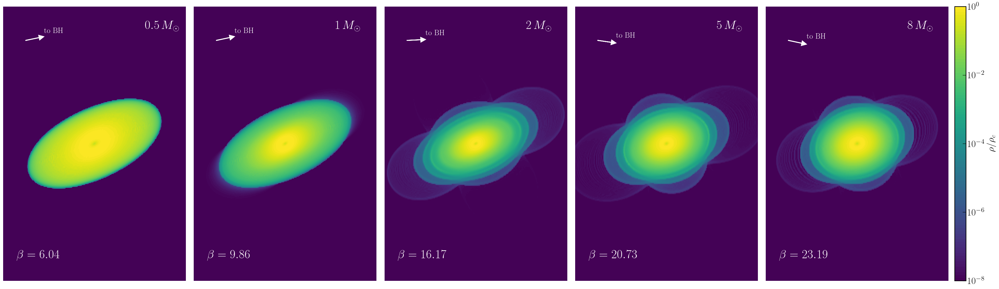

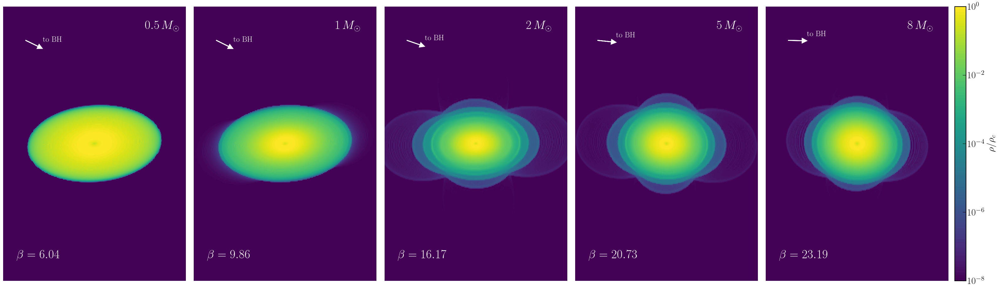

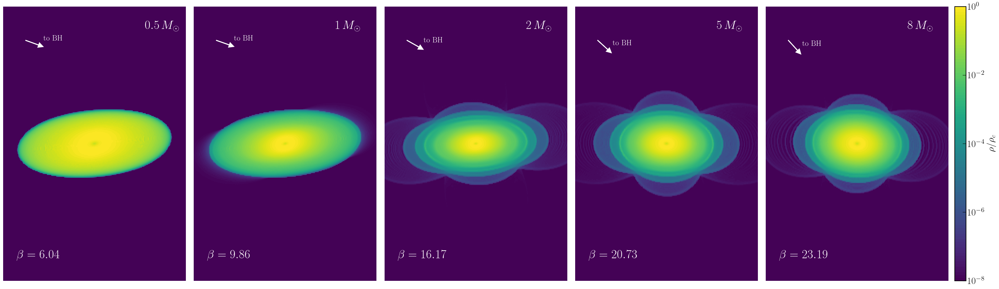

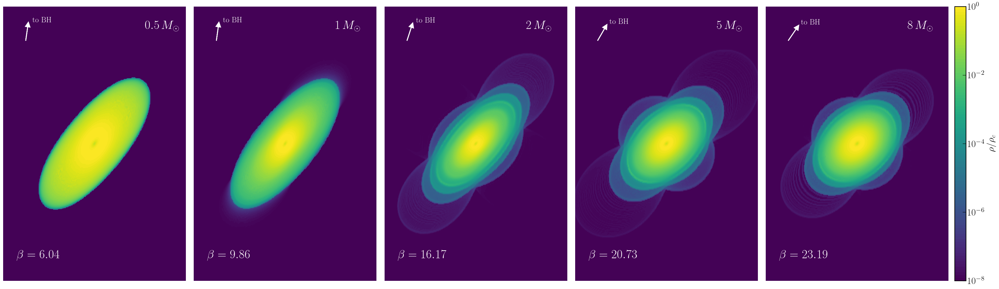

In [6]:
plot_dens(orbit="rel", MBH=Mbh, Rp=Rp, a=a, N=n)
plot_dens(orbit="rel", MBH=Mbh, Rp=Rp, a=-a, N=n)
plot_dens(orbit="rel", MBH=Mbh, Rp=Rp, a=0.0, N=n)
plot_dens(orbit="nwtn", MBH=Mbh, Rp=Rp, a=0.0, N=n)

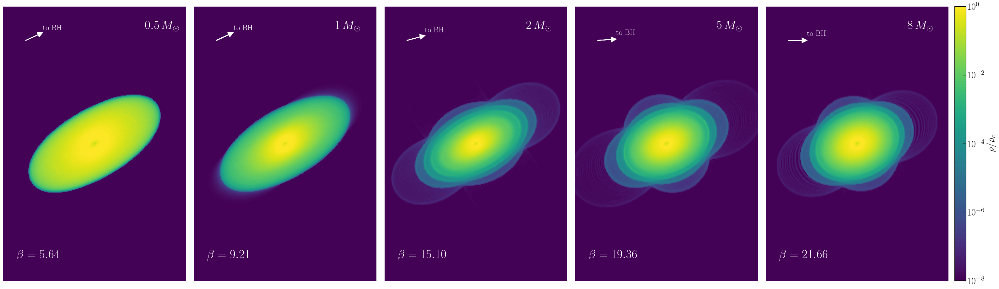

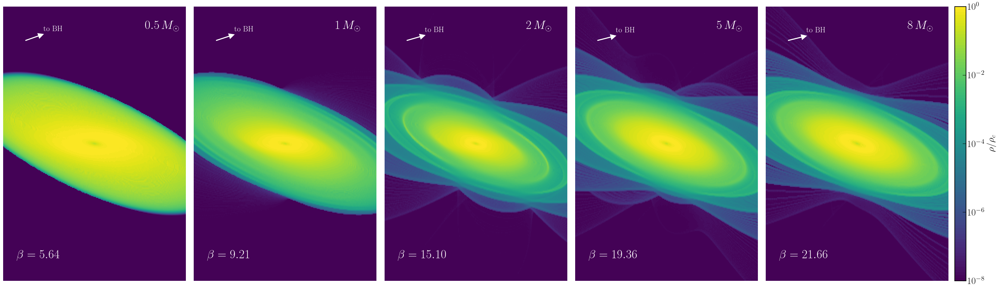

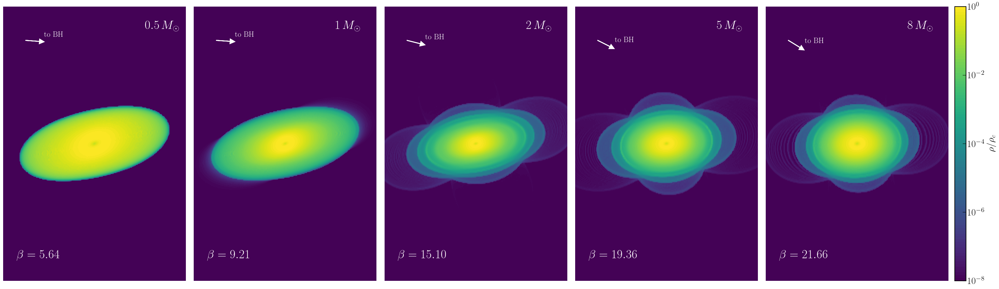

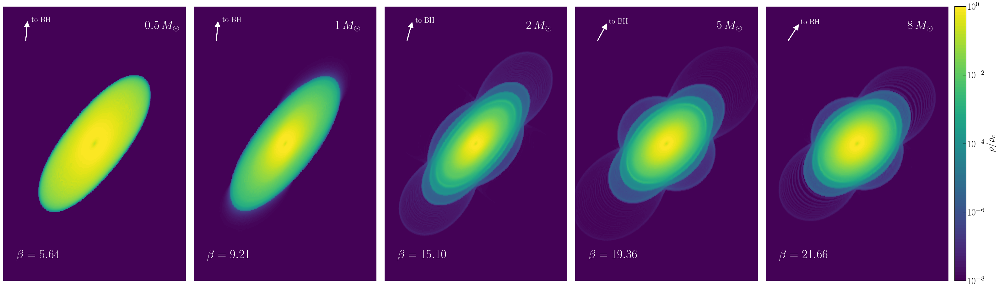

In [7]:
Mbh = 1e6
Rp = 5.3 
a = 0.6
n = 1500

plot_dens(orbit="rel", MBH=Mbh, Rp=Rp, a=a, N=n)
plot_dens(orbit="rel", MBH=Mbh, Rp=Rp, a=-a, N=n)
plot_dens(orbit="rel", MBH=Mbh, Rp=Rp, a=0.0, N=n)
plot_dens(orbit="nwtn", MBH=Mbh, Rp=Rp, a=0.0, N=n)

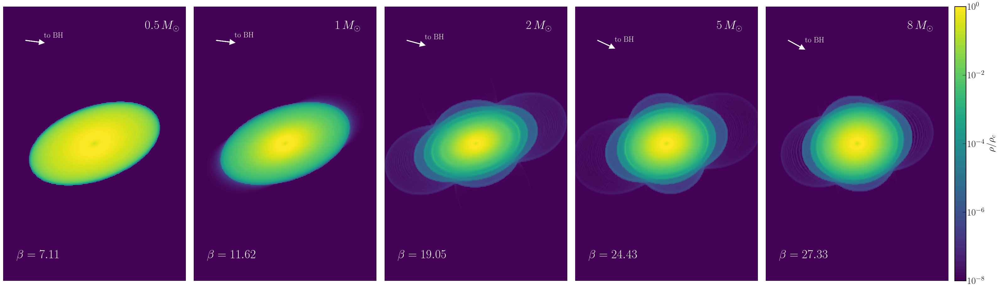

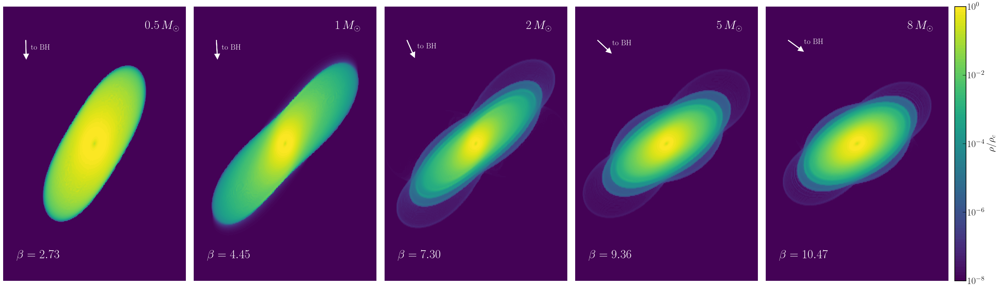

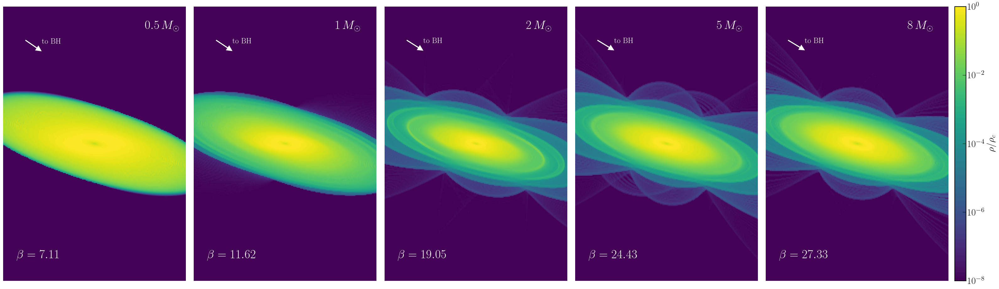

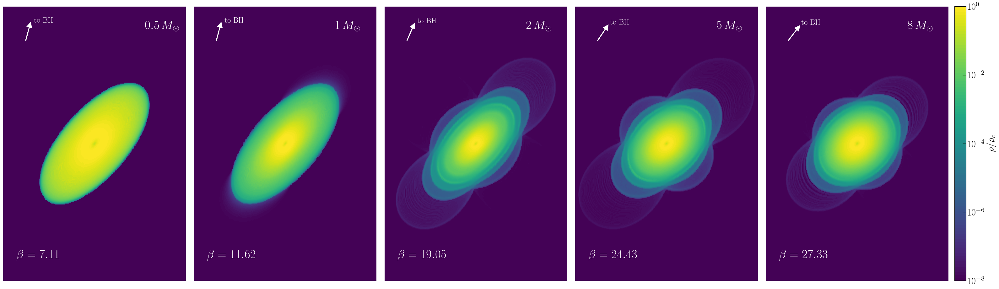

In [8]:
plot_dens(orbit="rel", MBH=Mbh, Rp=4.2, a=a, N=n)
plot_dens(orbit="rel", MBH=Mbh, Rp=10.96, a=-0.8, N=n)
plot_dens(orbit="rel", MBH=Mbh, Rp=4.2, a=0.0, N=n)
plot_dens(orbit="nwtn", MBH=Mbh, Rp=4.2, a=0.0, N=n)

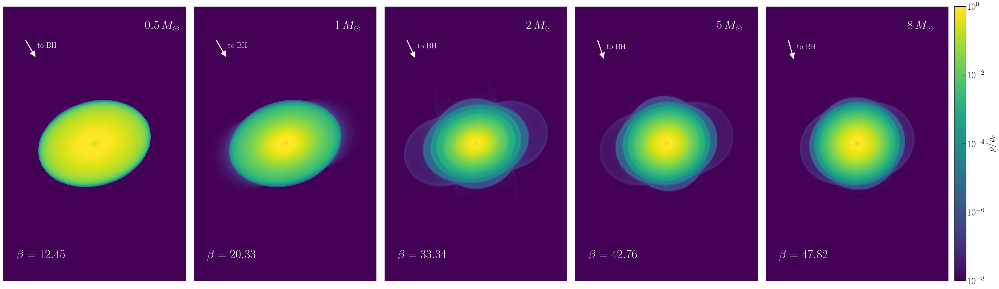

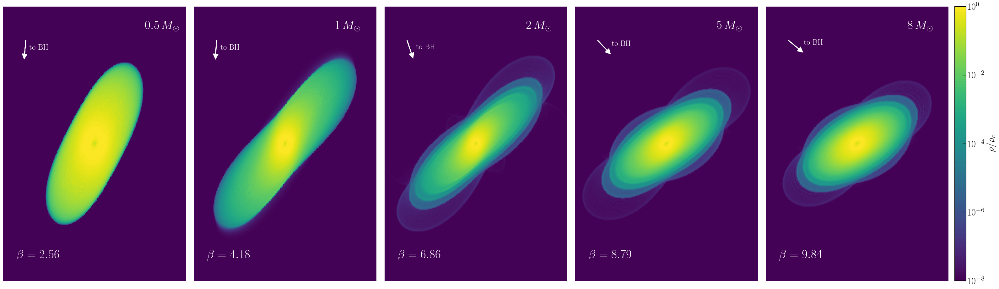

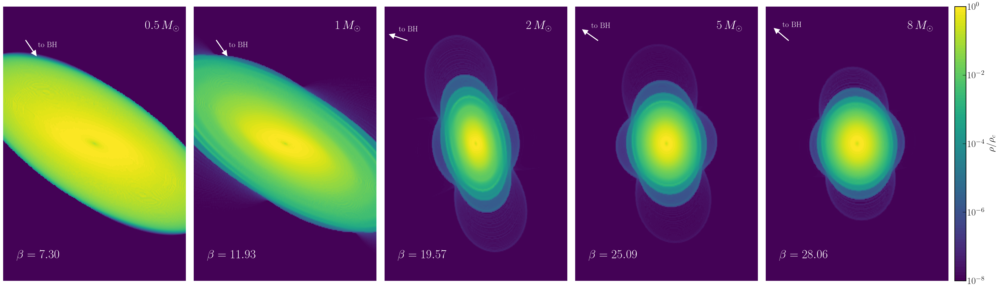

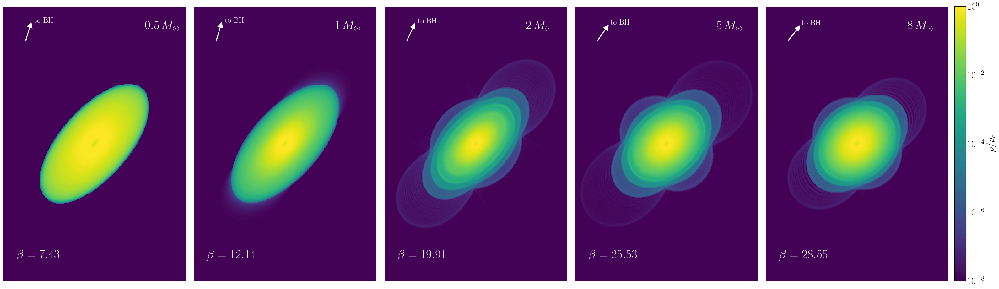

In [9]:
plot_dens(orbit="rel", MBH=Mbh, Rp=2.4, a=1.0, N=n)
plot_dens(orbit="rel", MBH=Mbh, Rp=11.67, a=-1.0, N=n)
plot_dens(orbit="rel", MBH=Mbh, Rp=4.09, a=0.0, N=n)
plot_dens(orbit="nwtn", MBH=Mbh, Rp=4.02, a=0.0, N=n)

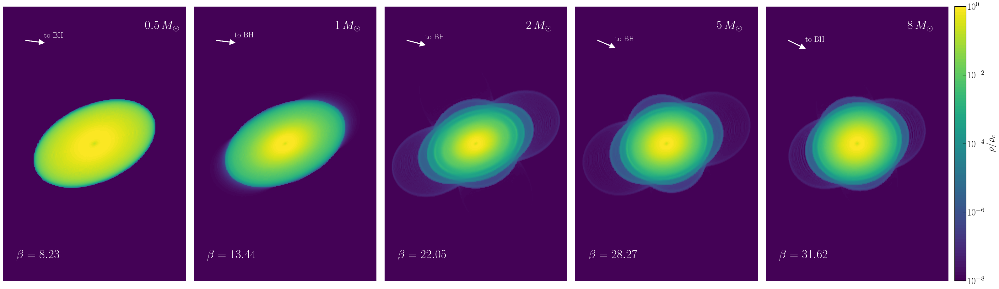

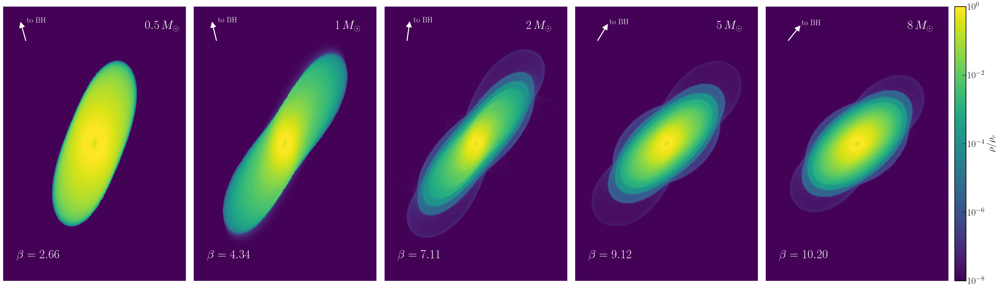

In [10]:
plot_dens(orbit="rel", MBH=Mbh, Rp=3.63, a=0.88, N=n)
plot_dens(orbit="rel", MBH=Mbh, Rp=11.25, a=0.88, N=n)

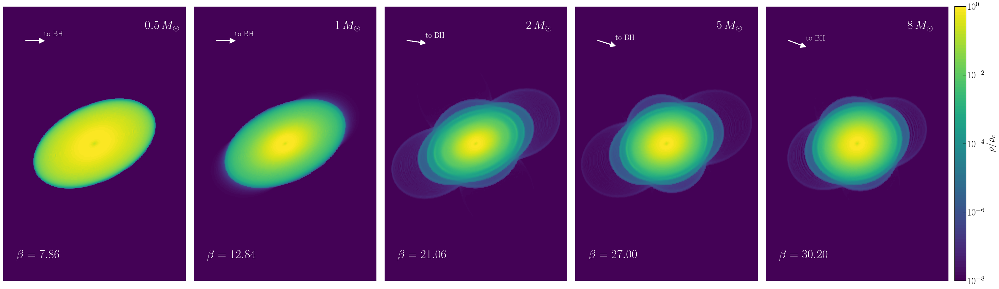

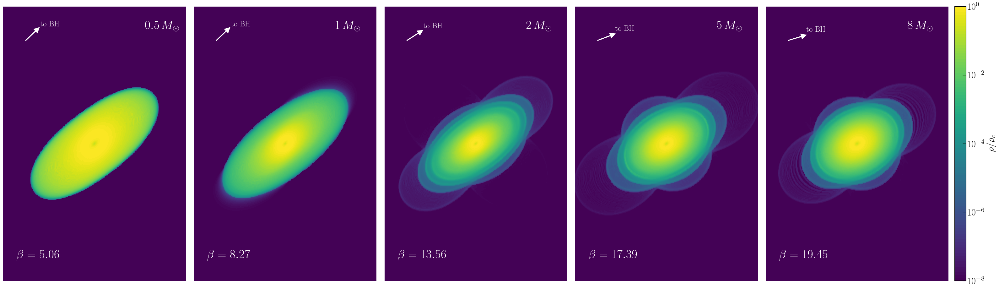

In [11]:
plot_dens(orbit="rel", MBH=Mbh, Rp=3.8, a=0.88, N=n)
plot_dens(orbit="rel", MBH=Mbh, Rp=5.9, a=0.88, N=n)

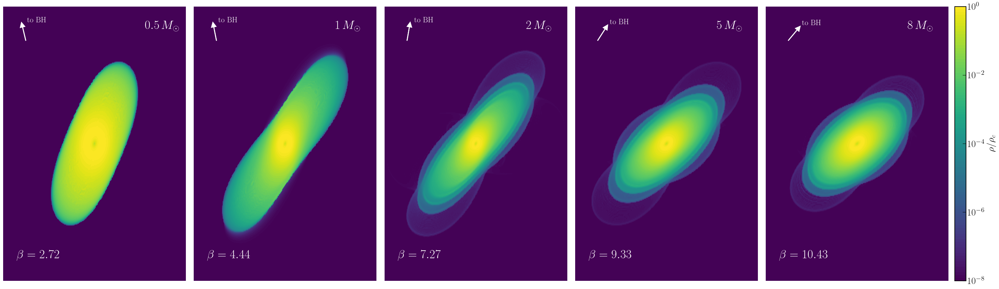

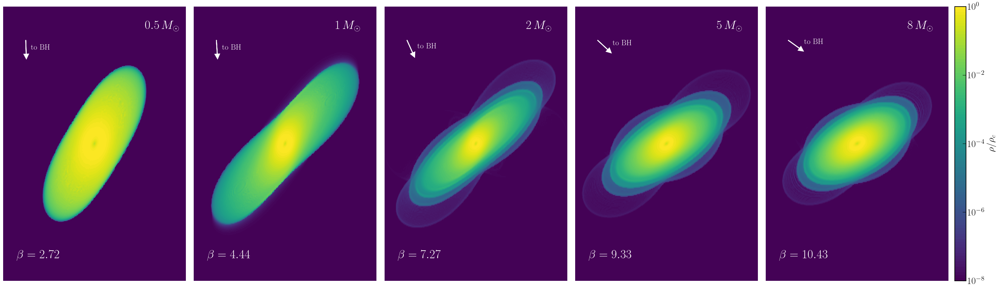

In [12]:
plot_dens(orbit="rel", MBH=Mbh, Rp=11, a=0.88, N=n)     # prograde
plot_dens(orbit="rel", MBH=Mbh, Rp=11, a=-0.88, N=n)    # retrograde